In [1]:
from interpretable_ssl.trainers.scpoli_trainer import *

INFO:pytorch_lightning.utilities.seed:Global seed set to 0
/home/icb/fatemehs.hashemig/miniconda3/envs/interpretable-ssl/lib/python3.12/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/icb/fatemehs.hashemig/miniconda3/envs/interpretable-ssl/lib/python3.12/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)
 captum (see https://github.com/pytorch/captum).


In [2]:
from interpretable_ssl.datasets.immune import *
ds = ImmuneDataset()
tr = ScpoliProtBarlowTrainer(ds)

loading data


/ictstr01/home/icb/fatemehs.hashemig/codes/interpretable-ssl/interpretable_ssl/datasets/dataset.py:43: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self.adata.obs['encoded_cell_type'] = self.le.transform(self.adata.obs.cell_type)
/ictstr01/home/icb/fatemehs.hashemig/codes/interpretable-ssl/interpretable_ssl/datasets/dataset.py:43: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self.adata.obs['encoded_cell_type'] = self.le.transform(self.adata.obs.cell_type)


In [42]:
tr.experiment_name = 'scpoli-wsampling-100epoch'
tr.num_prototypes = 64

model = tr.load_model()

Embedding dictionary:
 	Num conditions: [3]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 4000 64 10
	Mean/Var Layer in/out: 64 8
Decoder Architecture:
	First Layer in, out and cond:  8 64 10
	Output Layer in/out:  64 4000 



In [32]:
tr.ref.adata.obs.cell_type.nunique()

16

In [43]:
latent = model.get_representation(tr.ref.adata)
labels = tr.dataset.le.transform(tr.ref.adata.obs.cell_type.values)


In [44]:
adata = tr.ref.adata
adata.obsm['latent']=latent

/tmp/ipykernel_1122820/4184745286.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cell_type_colors = ListedColormap(plt.cm.get_cmap('tab20', len(unique_cell_types))(np.linspace(0, 1, len(unique_cell_types))))
/tmp/ipykernel_1122820/4184745286.py:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cluster_colors = ListedColormap(plt.cm.get_cmap('tab20', len(unique_clusters))(np.linspace(0, 1, len(unique_clusters))))


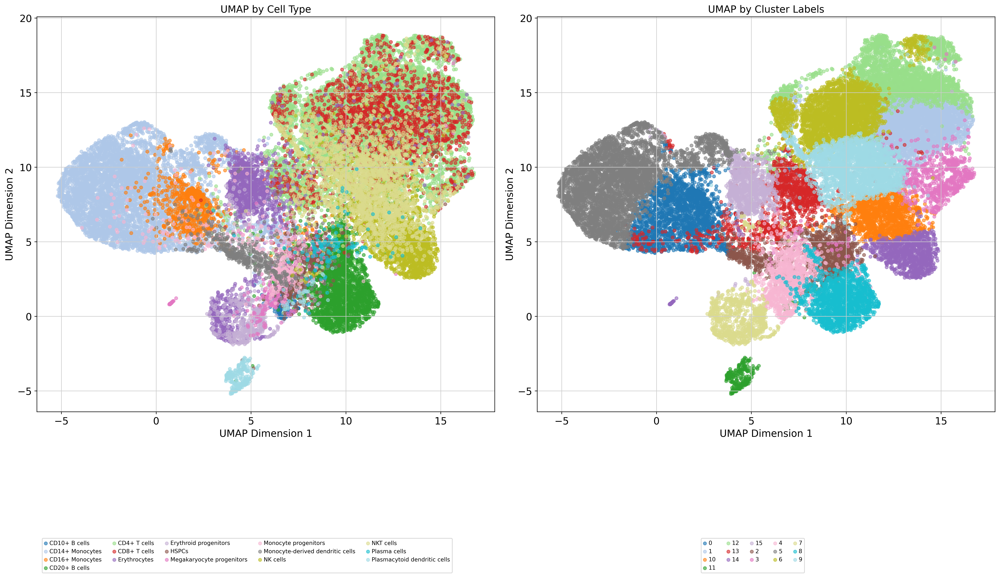

In [39]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap

def plot_umap_comparison(adata, latent_key, cluster_label_key, cell_type_key):
    """
    Plots UMAP projections colored by cluster labels and cell type labels.

    Parameters:
    adata (AnnData): AnnData object containing latent tensors and labels
    latent_key (str): Key in adata.obsm where the latent tensors are stored
    cluster_label_key (str): Key in adata.obs where the cluster labels are stored
    cell_type_key (str): Key in adata.obs where the cell type labels are stored
    """
    # Compute UMAP
    sc.pp.neighbors(adata, use_rep=latent_key)
    sc.tl.umap(adata)
    
    # Extract UMAP coordinates
    cell_umap = adata.obsm['X_umap']
    cluster_labels = adata.obs[cluster_label_key].values
    cell_types = adata.obs[cell_type_key].values
    
    # Define unique cell types and clusters for coloring
    unique_cell_types = np.unique(cell_types)
    unique_clusters = np.unique(cluster_labels)
    
    # Create a colormap for cell types and clusters
    cell_type_colors = ListedColormap(plt.cm.get_cmap('tab20', len(unique_cell_types))(np.linspace(0, 1, len(unique_cell_types))))
    cluster_colors = ListedColormap(plt.cm.get_cmap('tab20', len(unique_clusters))(np.linspace(0, 1, len(unique_clusters))))
    
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    
    # UMAP plot colored by cell type
    for i, cell_type in enumerate(unique_cell_types):
        indices = np.where(cell_types == cell_type)[0]
        axs[0].scatter(cell_umap[indices, 0], cell_umap[indices, 1], label=cell_type, color=cell_type_colors(i), alpha=0.6, s=20)
    
    axs[0].set_title('UMAP by Cell Type')
    axs[0].set_xlabel('UMAP Dimension 1')
    axs[0].set_ylabel('UMAP Dimension 2')
    
    # UMAP plot colored by cluster labels
    for i, cluster_label in enumerate(unique_clusters):
        indices = np.where(cluster_labels == cluster_label)[0]
        axs[1].scatter(cell_umap[indices, 0], cell_umap[indices, 1], label=cluster_label, color=cluster_colors(i), alpha=0.6, s=20)
    
    axs[1].set_title('UMAP by Cluster Labels')
    axs[1].set_xlabel('UMAP Dimension 1')
    axs[1].set_ylabel('UMAP Dimension 2')
    
    # Adjust layout to accommodate legends below plots
    plt.tight_layout(rect=[0, 0.1, 1, 1])
    
    # Create a legend for cell types
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.25, -0.15), fontsize=8, ncol=5)

    # Create a legend for clusters
    handles, labels = axs[1].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.75, -0.15), fontsize=8, ncol=5)
    
    plt.show()

# Example usage
# Assuming `adata` has been updated with cluster labels
# plot_umap_comparison(adata, latent_key='X_pca', cluster_label_key='kmeans_clusters', cell_type_key='cell_type')

plot_umap_comparison(adata, 'latent', 'cluster', 'cell_type')

In [40]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder

def fit_linear_classifier(adata, latent_key, cell_type_key):
    """
    Fits a linear classifier on the latent tensors and generates a classification report.

    Parameters:
    adata (AnnData): AnnData object containing latent tensors and cell type labels
    latent_key (str): Key in adata.obsm where the latent tensors are stored
    cell_type_key (str): Key in adata.obs where the cell type labels are stored

    Returns:
    dict: A dictionary containing the classification report
    """
    # Extract latent tensors and cell type labels
    X = adata.obsm[latent_key]
    y = adata.obs[cell_type_key]

    # Encode cell type labels to integers
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)

    # Fit a logistic regression classifier
    classifier = LogisticRegression(max_iter=1000, random_state=42)
    classifier.fit(X, y_encoded)

    # Predict the labels
    y_pred = classifier.predict(X)

    # Generate the classification report
    report = classification_report(y_encoded, y_pred, target_names=label_encoder.classes_, output_dict=True)
    
    return report

# Example usage
# Assuming `adata` is your AnnData object and latent space is stored in `adata.obsm['X_pca']`
report = fit_linear_classifier(adata, latent_key='latent', cell_type_key='cell_type')

pd.DataFrame(report)

/home/icb/fatemehs.hashemig/miniconda3/envs/interpretable-ssl/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/icb/fatemehs.hashemig/miniconda3/envs/interpretable-ssl/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/icb/fatemehs.hashemig/miniconda3/envs/interpretable-ssl/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` param

,CD10+ B cells,CD14+ Monocytes,CD16+ Monocytes,CD20+ B cells,CD4+ T cells,CD8+ T cells,Erythrocytes,Erythroid progenitors,HSPCs,Megakaryocyte progenitors,Monocyte progenitors,Monocyte-derived dendritic cells,NK cells,NKT cells,Plasma cells,Plasmacytoid dendritic cells,accuracy,macro avg,weighted avg
precision,0.666667,0.892777,0.605660,0.843928,0.729444,0.0,0.827949,0.652087,0.470588,0.496933,0.505747,0.755708,0.754327,0.489734,0.714286,0.958506,0.759069,0.647771,0.699531
recall,0.376812,0.949201,0.401250,0.906378,0.946792,0.0,0.784953,0.708423,0.405920,0.318898,0.308411,0.692469,0.743124,0.350627,0.193798,0.909449,0.759069,0.562282,0.759069
f1-score,0.481481,0.920125,0.482707,0.874039,0.824027,0.0,0.805878,0.679089,0.435868,0.388489,0.383164,0.722707,0.748684,0.408667,0.304878,0.933333,0.759069,0.587071,0.721237
support,207.000000,5886.000000,800.000000,2446.000000,9773.000000,1913.0,1502.000000,463.000000,473.000000,254.000000,428.000000,478.000000,1818.000000,2313.000000,129.000000,254.000000,0.759069,29137.000000,29137.000000


In [45]:

# Example usage
# Assuming `adata` is your AnnData object and latent space is stored in `adata.obsm['X_pca']`
report = fit_linear_classifier(adata, latent_key='latent', cell_type_key='cell_type')

pd.DataFrame(report)

,CD10+ B cells,CD14+ Monocytes,CD16+ Monocytes,CD20+ B cells,CD4+ T cells,CD8+ T cells,Erythrocytes,Erythroid progenitors,HSPCs,Megakaryocyte progenitors,Monocyte progenitors,Monocyte-derived dendritic cells,NK cells,NKT cells,Plasma cells,Plasmacytoid dendritic cells,accuracy,macro avg,weighted avg
precision,0.577778,0.919564,0.868385,0.879245,0.779401,0.500000,0.875573,0.713115,0.575916,0.546667,0.598086,0.695538,0.787931,0.638957,0.802817,0.950207,0.808937,0.731824,0.784273
recall,0.125604,0.975025,0.800000,0.952576,0.960913,0.000523,0.890146,0.751620,0.697674,0.322835,0.292056,0.554393,0.754125,0.561608,0.441860,0.901575,0.808937,0.623908,0.808937
f1-score,0.206349,0.946483,0.832791,0.914443,0.860691,0.001044,0.882800,0.731861,0.630975,0.405941,0.392465,0.616997,0.770658,0.597791,0.570000,0.925253,0.808937,0.642909,0.773991
support,207.000000,5886.000000,800.000000,2446.000000,9773.000000,1913.000000,1502.000000,463.000000,473.000000,254.000000,428.000000,478.000000,1818.000000,2313.000000,129.000000,254.000000,0.808937,29137.000000,29137.000000
